# Mounting google drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Loading Data from Pascal VOC 2012

In [ ]:
# Download and extract Pascal VOC 2012
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar
!mkdir -p data
!tar -xf VOCtrainval_11-May-2012.tar -C data/

--2025-07-10 21:56:21--  http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar
Resolving host.robots.ox.ac.uk (host.robots.ox.ac.uk)... 129.67.94.152
Connecting to host.robots.ox.ac.uk (host.robots.ox.ac.uk)|129.67.94.152|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1999639040 (1.9G) [application/x-tar]
Saving to: ‘VOCtrainval_11-May-2012.tar’

VOCtrainval_11-May- 100%[===================>]   1.86G   107MB/s    in 17s     

2025-07-10 21:56:38 (112 MB/s) - ‘VOCtrainval_11-May-2012.tar’ saved [1999639040/1999639040]



In [ ]:
import torch
from torch.utils.data import DataLoader, ConcatDataset
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tqdm import tqdm
import pandas as pd
import albumentations as A
from albumentations.pytorch import ToTensorV2
import os
import xml.etree.ElementTree as ET
from torch.utils.data import Dataset
from collections import Counter

# All the util functions are define here

# 1: Augmentation Functions

In [ ]:
# Albumentations bbox parameters
bbox_params = A.BboxParams(
    format='pascal_voc',
    label_fields=['class_labels'],
)

# Base (no augmentation)
def get_base_transforms():
    return A.Compose([
        A.Resize(320, 320),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=bbox_params)

# Cropping
def get_crop_transforms():
    return A.Compose([
        A.RandomSizedBBoxSafeCrop(512, 512, p=1.0),
        A.Resize(320, 320),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=bbox_params)

# Flip
def get_flip_transforms():
    return A.Compose([
        A.HorizontalFlip(p=1.0),
        A.Resize(320, 320),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=bbox_params)

# Rotation
def get_rotation_transforms():
    return A.Compose([
        A.ShiftScaleRotate(shift_limit=0.0, scale_limit=0.0, rotate_limit=20, p=1.0),
        A.Resize(320, 320),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=bbox_params)

# Color jitter
def get_color_transforms():
    return A.Compose([
        A.ColorJitter(p=1.0),
        A.Resize(320, 320),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=bbox_params)

# Mixed augmentations
def get_mix_transforms():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.HueSaturationValue(p=0.3),
        A.ColorJitter(p=0.3),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
        A.RandomSizedBBoxSafeCrop(512, 512, p=0.5),
        A.Resize(320, 320),
        A.Blur(blur_limit=3, p=0.1),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ], bbox_params=bbox_params)

# 2: model


In [ ]:
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn

def get_faster_rcnn_model(num_classes):
    model = fasterrcnn_mobilenet_v3_large_320_fpn(weights="DEFAULT")
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model


# 3: Dataset

In [ ]:
dataRoot="data/VOCdevkit/VOC2012"

VOC_CLASSES = [
    'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair',
    'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant',
    'sheep', 'sofa', 'train', 'tvmonitor'
]

# Mapping class names to indices (0 reserved for background)
CLASS_TO_IDX = {name: 1 for name in VOC_CLASSES}  # All target_class → label 1

class VOCDataset(Dataset):
    def __init__(self, root, image_set="train", transforms=None, target_class=None):
        self.root = root
        self.transforms = transforms
        self.target_class = target_class.lower() if target_class else None

        image_dir = os.path.join(root, "JPEGImages")
        annot_dir = os.path.join(root, "Annotations")
        image_set_path = os.path.join(root, "ImageSets", "Main", f"{image_set}.txt")

        with open(image_set_path) as f:
            all_ids = [line.strip() for line in f.readlines()]

        if self.target_class:
            class_file = os.path.join(root, "ImageSets", "Main", f"{self.target_class}_{image_set}.txt")
            filtered_ids = []
            with open(class_file) as f:
                for line in f:
                    img_id, presence = line.strip().split()
                    if presence == "1":
                        filtered_ids.append(img_id)
            self.ids = [img_id for img_id in all_ids if img_id in filtered_ids]
        else:
            self.ids = all_ids

        self.image_paths = [os.path.join(image_dir, f"{img_id}.jpg") for img_id in self.ids]
        self.annotation_paths = [os.path.join(annot_dir, f"{img_id}.xml") for img_id in self.ids]

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        annot_path = self.annotation_paths[idx]

        # Load and convert image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Parse annotations
        target = self.parse_voc_xml(annot_path)
        boxes = target["boxes"]
        labels = target["labels"]

        # Apply augmentations if defined
        if self.transforms:
            transformed = self.transforms(
                image=img,
                bboxes=boxes,
                class_labels=labels
            )
            img = transformed["image"]
            boxes = torch.tensor(transformed["bboxes"], dtype=torch.float32)
            labels = torch.tensor(transformed["class_labels"], dtype=torch.int64)

        return img, {"boxes": boxes, "labels": labels}

    def parse_voc_xml(self, annotation_path):
        tree = ET.parse(annotation_path)
        root = tree.getroot()

        boxes = []
        labels = []

        for obj in root.findall('object'):
            name = obj.find('name').text.lower().strip()
            if self.target_class and name != self.target_class:
                continue  # Skip non-target classes
            bbox = obj.find('bndbox')
            box = [
                float(bbox.find('xmin').text),
                float(bbox.find('ymin').text),
                float(bbox.find('xmax').text),
                float(bbox.find('ymax').text)
            ]
            boxes.append(box)
            labels.append(1)  # Label 1 for target class

        return {
            "boxes": boxes,
            "labels": labels
        }


Total images in training dataset: 151


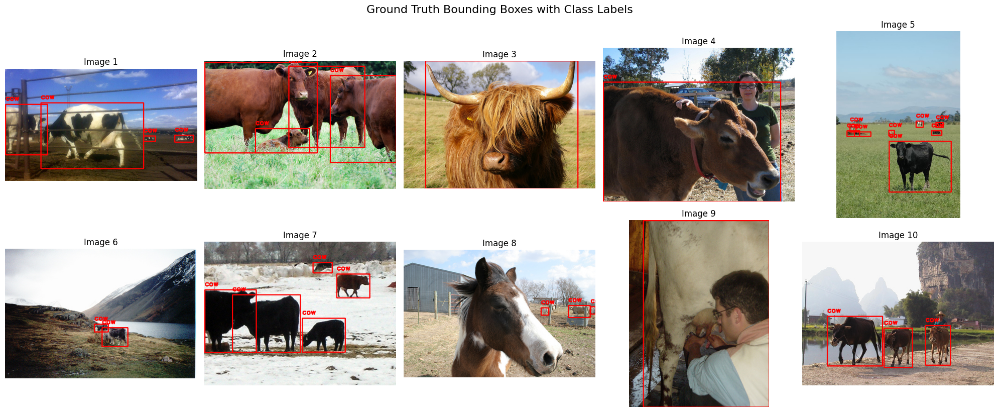

In [ ]:
training_dataset = VOCDataset(
   dataRoot,
    image_set="train",
    target_class="cow"
)

print("Total images in training dataset:", len(training_dataset))


# Plot 1st 10 Ground Truth Bounding Boxes with Class Labels from training data

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for idx in range(10):
    img, target = training_dataset[idx]
    boxes = target["boxes"]
    labels = target["labels"]

    # Image is already a NumPy array in (H, W, C) format
    img_np = img.copy()

    # Draw ground truth boxes and labels
    for box, label in zip(boxes, labels):
        x1, y1, x2, y2 = map(int, box)
        if training_dataset.target_class:
            class_name = training_dataset.target_class
        else:
            class_name = VOC_CLASSES[label - 1]  # If using all classes
        img_np = cv2.rectangle(img_np, (x1, y1), (x2, y2), (255, 0, 0), 2)
        img_np = cv2.putText(
            img_np, class_name, (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2
        )

    axes[idx].imshow(img_np)
    axes[idx].axis("off")
    axes[idx].set_title(f"Image {idx + 1}")

plt.tight_layout()
plt.suptitle("Ground Truth Bounding Boxes with Class Labels", fontsize=16, y=1.02)
plt.show()

# 5: Train and evaluate



In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
def train_and_evaluate(
    model_name,
    transform_fn,
    num_epochs=2,
    target_class=None,
    start_after=1,
    visualize=False,
    num_classes=2
):
    print(f"\n Training model: {model_name} | Target class: {target_class}")

    base_dataset = VOCDataset(
        root=dataRoot,
        image_set="train",
        transforms=get_base_transforms(),
        target_class=target_class
    )

    # Augmented dataset (same class, different transform)
    augmented_dataset = VOCDataset(
        root=dataRoot,
        image_set="train",
        transforms=transform_fn(),
        target_class=target_class
    )

    # Combine datasets
    full_dataset = ConcatDataset([base_dataset,augmented_dataset])
    train_loader = DataLoader(full_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)

    val_dataset = VOCDataset(
        root=dataRoot,
        image_set="val",
        transforms=get_base_transforms(),
        target_class=target_class
    )

    model = get_faster_rcnn_model(num_classes=num_classes).to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.0005)

    checkpoint_path = f"/content/drive/MyDrive/{model_name}_checkpoint_epoch{start_after}.pth"
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint['epoch'] + 1
        loss_curve = checkpoint['loss_curve']
        print(f"✅ Resumed training from epoch {start_epoch}")
    else:
        start_epoch = 0
        loss_curve = []
        print("🆕 Starting training from scratch...")


    # trainig
    for epoch in range(start_epoch, num_epochs):
        model.train()
        total_loss = 0.0

        for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            total_loss += losses.item()

        avg_loss = total_loss / len(train_loader)
        loss_curve.append(avg_loss)
        # torch.save({
        #     'epoch': epoch,
        #     'model_state_dict': model.state_dict(),
        #     'optimizer_state_dict': optimizer.state_dict(),
        #     'loss_curve': loss_curve
        # }, f"/content/drive/MyDrive/{model_name}_checkpoint_epoch{epoch+1}.pth")
        print(f"{model_name} - Epoch {epoch + 1} Avg Loss: {avg_loss:.4f}")

    # Save loss curve with correct epoch numbering
    epoch_range = list(range(1, num_epochs + 1))
    df = pd.DataFrame({
        "Epoch": epoch_range,
        "Average_Loss": loss_curve
    })
    df.to_csv(f"/content/drive/MyDrive/{model_name}_loss_curve.csv", index=False)
    print(f"Loss curve saved to Google Drive as {model_name}_loss_curve.csv")

    # Plotting loss curve
    plt.figure(figsize=(8, 5))
    plt.plot(epoch_range, loss_curve, marker='o', linestyle='-')
    plt.title(f"{model_name} - Average Loss per Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.show()

    torch.save(model.state_dict(), f"/content/drive/MyDrive/{model_name}.pth")
    print(f"Saved as {model_name}.pth")

In [ ]:
def compute_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0:
        return 0.0

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def evaluate_model_iou(model_path, model_name, dataset, num_images=10):
    model = get_faster_rcnn_model(num_classes=21)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    iou_scores = []

    for i in range(num_images):
        image, target = dataset[i]
        true_boxes = target['boxes'].cpu().numpy()
        image = image.to(device)

        with torch.no_grad():
            prediction = model([image])[0]
        pred_boxes = prediction['boxes'].cpu().numpy()

        # Match predictions to GT 1-to-1 (simple version)
        for j in range(min(len(pred_boxes), len(true_boxes))):
            iou = compute_iou(pred_boxes[j], true_boxes[j])
            iou_scores.append(iou)

    avg_iou = sum(iou_scores) / len(iou_scores)
    print(f"{model_name} - Avg IoU on {num_images} samples: {avg_iou:.4f}")
    return avg_iou

In [ ]:
def load_and_evaluate(
    model_name,
    transform_fn,
    num_epochs=2,
    target_class=None,
    start_after=1,
    visualize=False,
    num_classes=2
):
    print(f"\n Training model: {model_name} | Target class: {target_class}")

    base_dataset = VOCDataset(
        root=dataRoot,
        image_set="train",
        transforms=get_base_transforms(),
        target_class=target_class
    )

    val_dataset = VOCDataset(
        root=dataRoot,
        image_set="val",
        transforms=get_base_transforms(),
        target_class=target_class
    )

    model = get_faster_rcnn_model(num_classes=num_classes).to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)

    # load model
    model.load_state_dict(torch.load(f"/content/drive/MyDrive/{model_name}.pth"))


    # Evaluation on validation set
    model.eval()
    ious = []

    for i in range(152):
        image, target = val_dataset[i]
        image = image.to(device)
        true_boxes = target["boxes"].cpu().numpy()

        with torch.no_grad():
            prediction = model([image])[0]

        pred_boxes = prediction["boxes"].cpu().numpy()

        for j in range(min(len(pred_boxes), len(true_boxes))):
            iou = compute_iou(pred_boxes[j], true_boxes[j])
            ious.append(iou)

    avg_iou = sum(ious) / len(ious)
    print(f"{model_name} - Avg IoU on 152 validation images: {avg_iou:.4f}")

    # Save IoUs to CSV
    iou_df = pd.DataFrame({
        "Sample": list(range(1, len(ious) + 1)),
        "IoU": ious
    })
    iou_df.to_csv(f"/content/drive/MyDrive/{model_name}_iou_scores.csv", index=False)
    print(f"IoU scores saved to {model_name}_iou_scores.csv")

    #  Visualization
    if visualize:
        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        axes = axes.flatten()

        for idx in range(10):
            img, _ = base_dataset[idx]
            img_tensor = img.to(device)

            with torch.no_grad():
                prediction = model([img_tensor])[0]


            img_np = img.cpu().permute(1, 2, 0).numpy()
            img_np = (img_np * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406]
            img_np = (img_np * 255).astype("uint8")

            # Draw ground truth boxes and labels
            for box, label in zip(prediction["boxes"], prediction["labels"]):
                x1, y1, x2, y2 = map(int, box)
                if target_class:
                 class_name = target_class
                else:
                  class_name = VOC_CLASSES[label - 1]
                img_np = cv2.rectangle(img_np, (x1, y1), (x2, y2), (255, 0, 0), 2)
                img_np = cv2.putText(
                    img_np, class_name, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2
                )

            axes[idx].imshow(img_np)
            axes[idx].axis("off")
            axes[idx].set_title(f"{model_name} - Image {idx+1}")

        plt.tight_layout()
        plt.suptitle(f"{model_name}: Predictions on 10 tain Images", fontsize=16, y=1.02)
        plt.show()

        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        axes = axes.flatten()

        for idx in range(10):
            img, _ = val_dataset[idx]
            img_tensor = img.to(device)

            with torch.no_grad():
                prediction = model([img_tensor])[0]


            img_np = img.cpu().permute(1, 2, 0).numpy()
            img_np = (img_np * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406]
            img_np = (img_np * 255).astype("uint8")

            # Draw ground truth boxes and labels
            for box, label in zip(prediction["boxes"], prediction["labels"]):
                x1, y1, x2, y2 = map(int, box)
                if target_class:
                 class_name = target_class
                else:
                  class_name = VOC_CLASSES[label - 1]
                img_np = cv2.rectangle(img_np, (x1, y1), (x2, y2), (255, 0, 0), 2)
                img_np = cv2.putText(
                    img_np, class_name, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2
                )

            axes[idx].imshow(img_np)
            axes[idx].axis("off")
            axes[idx].set_title(f"{model_name} - Image {idx+1}")

        plt.tight_layout()
        plt.suptitle(f"{model_name}: Predictions on 10 Val Images", fontsize=16, y=1.02)
        plt.show()

### Data exploration

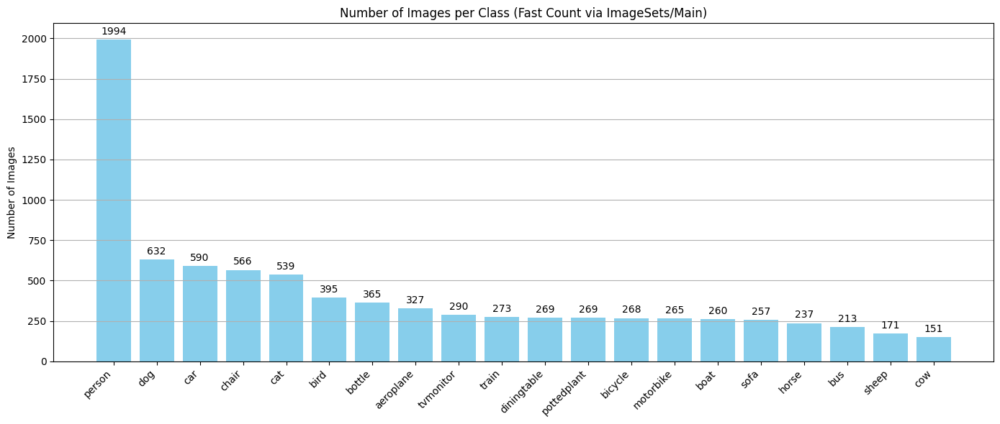

In [ ]:
# check No of images in each class

imageset_dir = os.path.join(dataRoot, "ImageSets", "Main")

class_counts = {}

for cls in VOC_CLASSES:
    cls_file = os.path.join(imageset_dir, f"{cls}_train.txt")
    count = 0
    with open(cls_file) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 2 and parts[1] == '1':
                count += 1
    class_counts[cls] = count


# Sort and unpack
sorted_class_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
classes = [cls for cls, _ in sorted_class_counts]
counts = [count for _, count in sorted_class_counts]

# Plot
plt.figure(figsize=(14, 6))
bars = plt.bar(classes, counts, color='skyblue')
plt.gca().bar_label(bars, padding=3)
plt.xticks(rotation=45, ha='right')
plt.ylabel("Number of Images")
plt.title("Number of Images per Class (Fast Count via ImageSets/Main)")
plt.tight_layout()
plt.grid(axis='y')
plt.show()


In [ ]:
training_dataset = VOCDataset(
   dataRoot,
    image_set="train",
    target_class="cow"
)

print("Total images in training dataset:", len(training_dataset))

Total images in training dataset: 151


# showing first 10 Ground Truth Bounding Boxes with Class Labels from training data

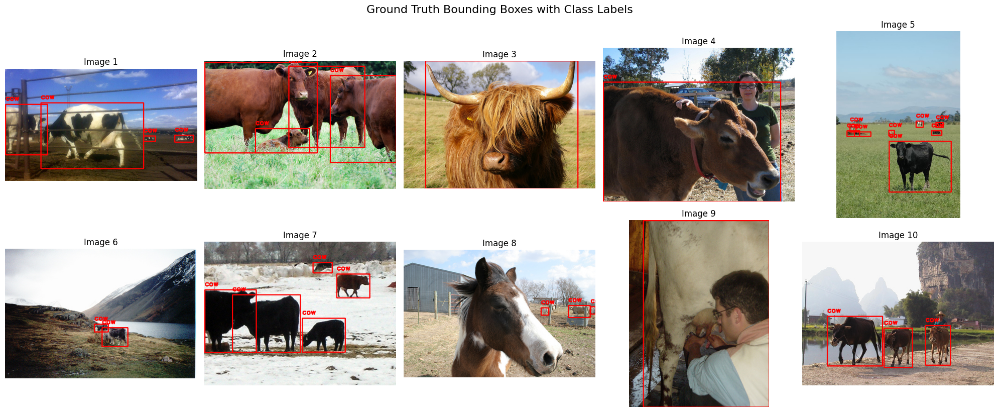

In [ ]:
# Plot 1st 10 Ground Truth Bounding Boxes with Class Labels from training data

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for idx in range(10):
    img, target = training_dataset[idx]
    boxes = target["boxes"]
    labels = target["labels"]

    # Image is already a NumPy array in (H, W, C) format
    img_np = img.copy()

    # Draw ground truth boxes and labels
    for box, label in zip(boxes, labels):
        x1, y1, x2, y2 = map(int, box)
        if training_dataset.target_class:
            class_name = training_dataset.target_class
        else:
            class_name = VOC_CLASSES[label - 1]  # If using all classes
        img_np = cv2.rectangle(img_np, (x1, y1), (x2, y2), (255, 0, 0), 2)
        img_np = cv2.putText(
            img_np, class_name, (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2
        )

    axes[idx].imshow(img_np)
    axes[idx].axis("off")
    axes[idx].set_title(f"Image {idx + 1}")

plt.tight_layout()
plt.suptitle("Ground Truth Bounding Boxes with Class Labels", fontsize=16, y=1.02)
plt.show()

# 1: Train Faster R-CNN with no augmentation (only resizing + normalization) to use as a baseline for comparison.


 Training model: t_mix_model | Target class: cow
t_mix_model - Avg IoU on 152 validation images: 0.3807
IoU scores saved to t_mix_model_iou_scores.csv


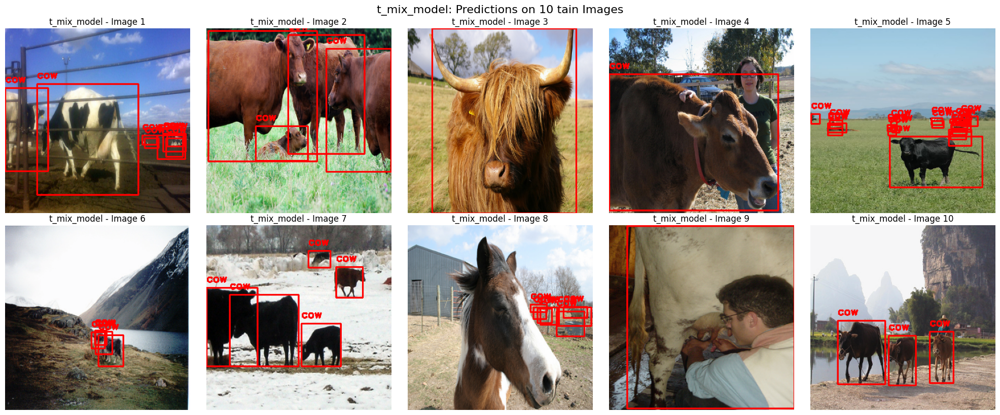

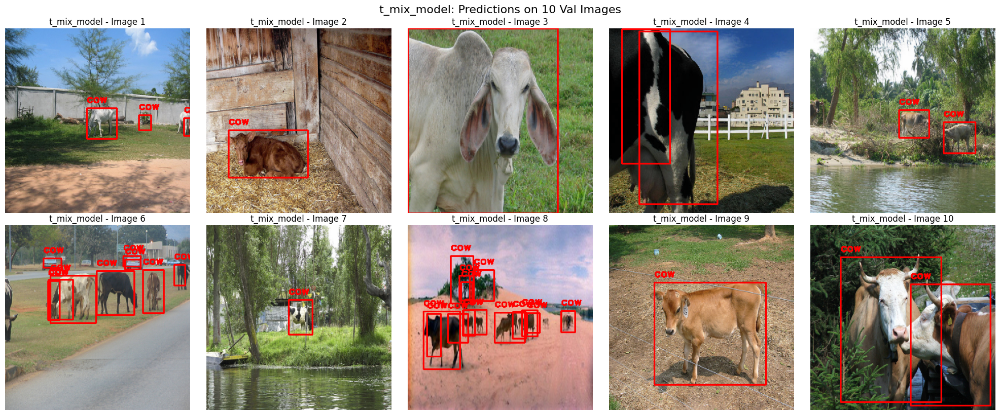

In [ ]:
# models are already trained, just replace the name below to do further things with them and don't forget to improt them properly

load_and_evaluate(
    model_name="t_mix_model",
    transform_fn=get_rotation_transforms,
    num_epochs=1,
    target_class="cow",
    visualize=True,
)


# plot the combined loss graph

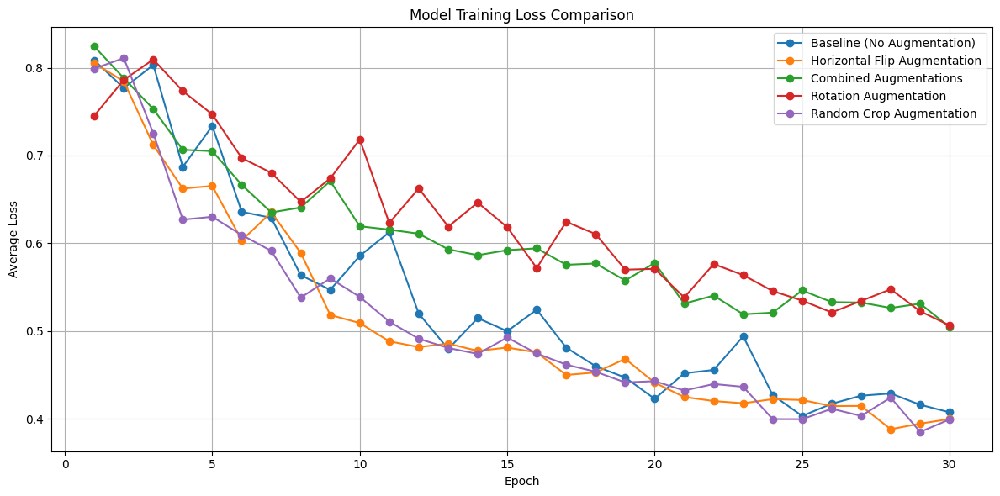

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Path where your CSV files are stored (update if different)
drive_path = "/content/drive/MyDrive"

# Model loss CSV files
model_files = [
    "t_baseline_loss_curve.csv",
    "t_flip_model_loss_curve.csv",
    "t_mix_model_loss_curve.csv",
    "t_Rotation_model_loss_curve.csv",
    "t_get_crop_transforms_loss_curve.csv"
]

# Descriptive names for the legend
label_mapping = {
    "t_baseline": "Baseline (No Augmentation)",
    "t_flip_model": "Horizontal Flip Augmentation",
    "t_mix_model": "Combined Augmentations",
    "t_Rotation_model": "Rotation Augmentation",
    "t_get_crop_transforms": "Random Crop Augmentation"
}

# Plot
plt.figure(figsize=(12, 6))

for filename in model_files:
    full_path = os.path.join(drive_path, filename)
    df = pd.read_csv(full_path)

    model_key = filename.replace("_loss_curve.csv", "")
    readable_name = label_mapping.get(model_key, model_key)

    plt.plot(df["Epoch"], df["Average_Loss"], marker='o', label=readable_name)

plt.title("Model Training Loss Comparison")
plt.xlabel("Epoch")
plt.ylabel("Average Loss")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


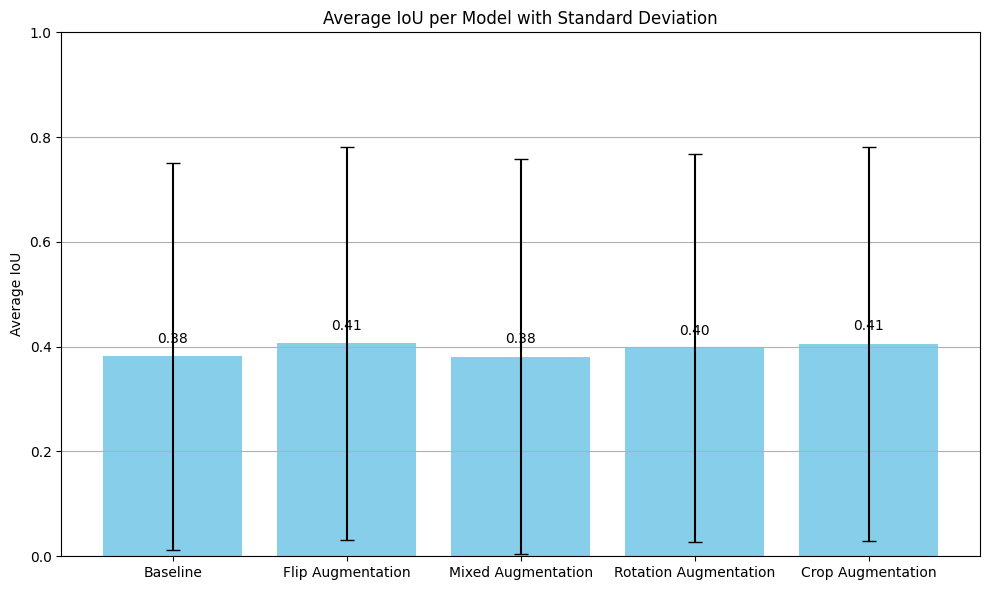

/tmp/ipython-input-22-1033990726.py:59: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(iou_dict.values(), labels=iou_dict.keys(), patch_artist=True)


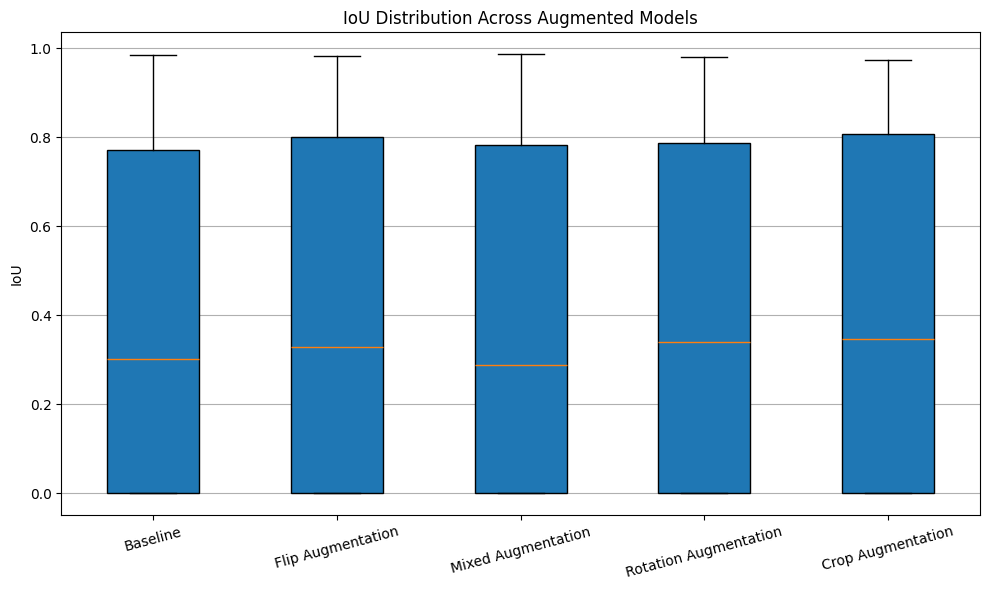

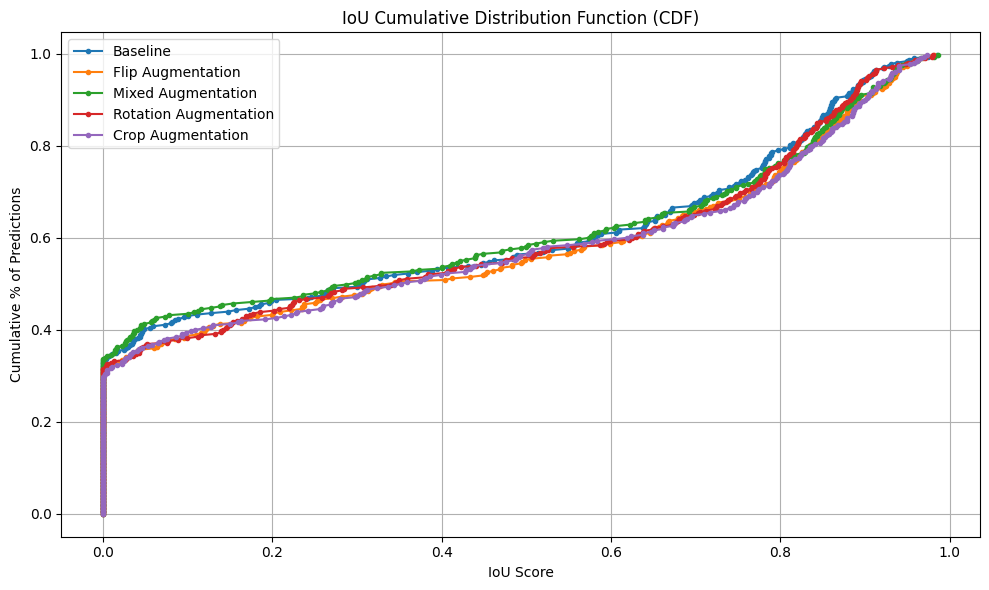

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define models and readable names
models = {
    "t_baseline": "Baseline",
    "t_flip_model": "Flip Augmentation",
    "t_mix_model": "Mixed Augmentation",
    "t_Rotation_model": "Rotation Augmentation",
    "t_get_crop_transforms": "Crop Augmentation"
}

base_path = "/content/drive/MyDrive"

# Store data for all models
iou_dict = {}
avg_ious = []
std_ious = []
model_names = []

for file_prefix, label in models.items():
    file_path = os.path.join(base_path, f"{file_prefix}_iou_scores.csv")

    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        if "IoU" in df.columns and not df["IoU"].isnull().all():
            iou_dict[label] = df["IoU"].dropna().tolist()
            model_names.append(label)
            avg_ious.append(df["IoU"].mean())
            std_ious.append(df["IoU"].std())
        else:
            print(f"⚠️ Invalid or empty IoU data in: {file_path}")
    else:
        print(f"❌ File not found: {file_path}")

# 1️⃣ Bar Plot: Average IoU with Std Dev
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, avg_ious, yerr=std_ious, capsize=5, color='skyblue')
plt.title("Average IoU per Model with Standard Deviation")
plt.ylabel("Average IoU")
plt.ylim(0, 1)
plt.grid(axis='y')

# Annotate bar values
for bar, val in zip(bars, avg_ious):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
             f"{val:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

# 2️⃣ Box Plot: IoU distribution per model
plt.figure(figsize=(10, 6))
plt.boxplot(iou_dict.values(), labels=iou_dict.keys(), patch_artist=True)
plt.title("IoU Distribution Across Augmented Models")
plt.ylabel("IoU")
plt.grid(axis='y')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()

# 3️⃣ CDF Plot: Cumulative % of samples above IoU
plt.figure(figsize=(10, 6))
for label, ious in iou_dict.items():
    sorted_iou = sorted(ious)
    cdf = [i / len(sorted_iou) for i in range(len(sorted_iou))]
    plt.plot(sorted_iou, cdf, label=label, marker='.')

plt.title("IoU Cumulative Distribution Function (CDF)")
plt.xlabel("IoU Score")
plt.ylabel("Cumulative % of Predictions")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import os

# Define model names and display labels
model_info = {
    "t_baseline": "Baseline",
    "t_flip_model": "Flip Augmentation",
    "t_mix_model": "Mixed Augmentation",
    "t_Rotation_model": "Rotation Augmentation",
    "t_get_crop_transforms": "Crop Augmentation"
}

metrics = []

for model_file, display_name in model_info.items():
    # Load IoU scores
    iou_path = f"/content/drive/MyDrive/{model_file}_iou_scores.csv"
    if not os.path.exists(iou_path):
        print(f"❌ Missing IoU file for {display_name}")
        continue

    iou_df = pd.read_csv(iou_path)

    if "IoU" not in iou_df.columns:
        print(f"⚠️ Missing IoU column in {iou_path}. Skipping...")
        continue

    ious = iou_df["IoU"].dropna().tolist()
    total_preds = len(ious)
    tp = sum(iou >= 0.5 for iou in ious)

    precision = tp / total_preds if total_preds > 0 else 0.0
    recall = 1.0  # Assumption based on original code
    avg_iou = sum(ious) / total_preds if total_preds > 0 else 0.0

    # Load last epoch's loss
    loss_path = f"/content/drive/MyDrive/{model_file}_loss_curve.csv"
    if os.path.exists(loss_path):
        loss_df = pd.read_csv(loss_path)
        avg_loss = loss_df["Average_Loss"].iloc[-1]
    else:
        avg_loss = None

    metrics.append({
        "Model": display_name,
        "Precision": round(precision, 6),
        "Recall": recall,
        "Avg IoU": round(avg_iou, 6),
        "Avg Loss": round(avg_loss, 6) if avg_loss is not None else None
    })

# Create DataFrame with index starting from 1
metrics_df = pd.DataFrame(metrics, index=range(1, len(metrics) + 1))

# Show and save
print(metrics_df)
metrics_df.to_csv("/content/drive/MyDrive/model_summary_metrics.csv", index=True)


                   Model  Precision  Recall   Avg IoU  Avg Loss
1               Baseline   0.433121     1.0  0.381445  0.407414
2      Flip Augmentation   0.445545     1.0  0.406203  0.399776
3     Mixed Augmentation   0.415873     1.0  0.380719  0.504428
4  Rotation Augmentation   0.441640     1.0  0.397511  0.506406
5      Crop Augmentation   0.435484     1.0  0.405926  0.399341
